# UFO Sightings

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

import plotly.plotly as py
import plotly.graph_objs as go
from plotly import tools
from plotly.offline import iplot, init_notebook_mode
init_notebook_mode()

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [2]:
df = pd.read_csv('scrubbed.csv', low_memory=False)
df.head(3)

,datetime,city,state,country,shape,duration (seconds),duration (hours/min),comments,date posted,latitude,longitude
0,10/10/1949 20:30,san marcos,tx,us,cylinder,2700,45 minutes,This event took place in early fall around 194...,4/27/2004,29.8830556,-97.941111
1,10/10/1949 21:00,lackland afb,tx,NaN,light,7200,1-2 hrs,1949 Lackland AFB&#44 TX. Lights racing acros...,12/16/2005,29.38421,-98.581082
2,10/10/1955 17:00,chester (uk/england),NaN,gb,circle,20,20 seconds,Green/Orange circular disc over Chester&#44 En...,1/21/2008,53.2,-2.916667


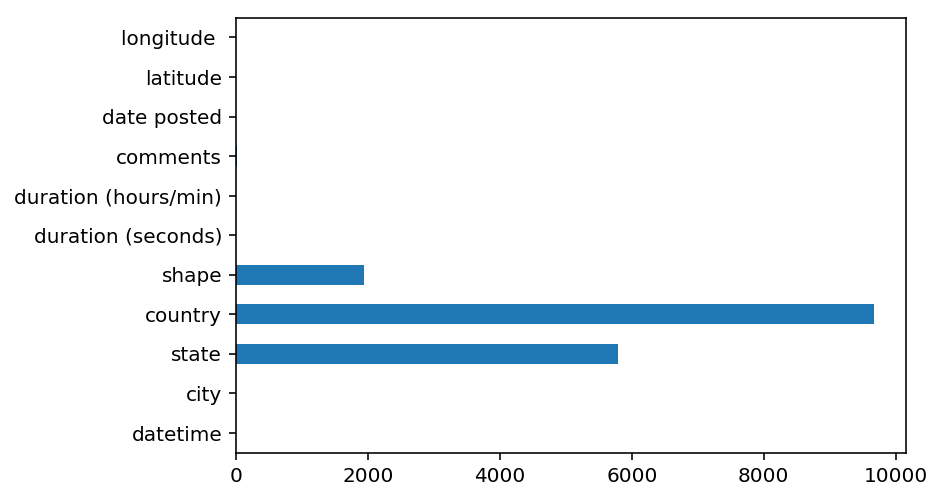

In [3]:
# Let's take a quick look at the distribution of missing values
df.isnull().sum().plot(kind='barh')

In [4]:
# Only want to look at occurences in the US
# Create a list of US states for filtering
us_states = np.asarray(['AK', 'AL', 'AR', 'AZ', 'CA', 'CO', 'CT', 'DC', 'DE', 'FL', 'GA',
                        'HI', 'IA', 'ID', 'IL', 'IN', 'KS', 'KY', 'LA', 'MA', 'MD', 'ME',
                        'MI', 'MN', 'MO', 'MS', 'MT', 'NC', 'ND', 'NE', 'NH', 'NJ', 'NM',
                        'NV', 'NY', 'OH', 'OK', 'OR', 'PA', 'RI', 'SC', 'SD', 'TN', 'TX',
                        'UT', 'VA', 'VT', 'WA', 'WI', 'WV', 'WY'])

In [5]:
# Standardize column names & information
df.columns = df.columns.str.replace('\s+', '_')
df['latitude'] = pd.to_numeric(df['latitude'], errors='coerce')
df = df.rename(columns={'longitude_':'longitude'})
df['city'] = df['city'].str.title()
df['state'] = df['state'].str.upper()
df = df[df['state'].isin(us_states)]

# Convert date columns to datetime dtype for consistent plotting
df['datetime'] = pd.to_datetime(df['datetime'], errors='coerce')
df.insert(1, 'year', df['datetime'].dt.year)
df['year'] = df['year'].fillna(0).astype(int)

# UFO sightings in United States only (70,805 rows)
df = df[df['state'].isin(us_states)].sort_values('year')
df = df[(df.latitude > 15) & (df.longitude < -65)]
df = df[(df.latitude > 50) & (df.longitude > -125) == False]
df = df[df['city'].str.contains('\(Canada\)|\(Mexico\)') == False]

In [6]:
# Drop columns with duplicate information
df.drop('duration_(hours/min)', axis=1, inplace=True)

In [17]:
# export out updated data set to CSV
df.to_csv('cleaned.csv', index=False)

## Where have UFOs been sighted in the US ?

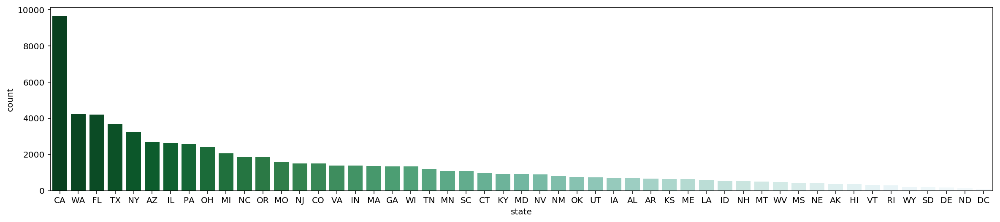

In [91]:
plt.subplots(figsize=(20,4))
sns.countplot(x='state', data=df, order = df.state.value_counts().index, palette='BuGn_r');

In [8]:
# code block from https://www.kaggle.com/abigaillarion/ufo-reports-in-united-states
df['text'] = df[df.year > 0]['datetime'].dt.strftime('%B %-d, %Y')

data = [dict(
        type = 'scattergeo',
        locationmode = 'USA-states',
        lon = df[df.year > 0]['longitude'],
        lat = df[df.year > 0]['latitude'],
        text = df[df.year > 0]['text'],
        mode = 'markers',
        marker = dict(
            size = 4.5,
            opacity = 0.75,
            color = 'rgb(51, 170, 164)',
            line = dict(color = 'rgb(255, 255, 255)', width = 1))
        )]

layout = dict(
         title = 'UFO Reports by Latitude/Longitude in United States (1910-2014)',
         geo = dict(
             scope = 'usa',
             projection = dict(type = 'albers usa'),
             showland = True,
             landcolor = 'rgb(250, 250, 250)',
             subunitwidth = 1,
             subunitcolor = 'rgb(217, 217, 217)',
             countrywidth = 1,
             countrycolor = 'rgb(217, 217, 217)',
             showlakes = True,
             lakecolor = 'rgb(255, 255, 255)')
        )

figure = dict(data = data, layout = layout)
iplot(figure)

## Have reported sightings increased over time?

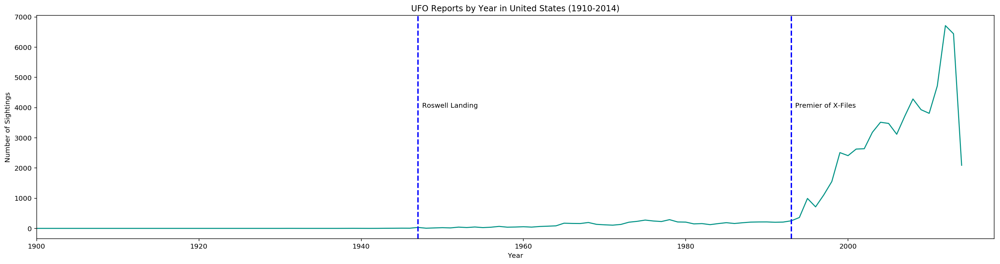

In [63]:
subset = pd.DataFrame(df.groupby(['year']).text.count().reset_index())
plt.subplots(figsize=(25,6))
plt.plot(subset.year, subset.text, color ='XKCD:teal')
plt.xlabel('Year')
plt.xlim(1900,2018)
plt.ylabel('Number of Sightings')
plt.title('UFO Reports by Year in United States (1910-2014)')
plt.axvline(x=1993, color='blue', linestyle='--', lw=2)
plt.text(1993.5, 4000, 'Premier of X-Files',color='black', fontsize=10)
plt.axvline(x=1947, color='blue', linestyle='--', lw=2)
plt.text(1947.5, 4000, 'Roswell Landing',color='black', fontsize=10);

## How do people describe their encounters?

In [82]:
# Subset the dataframe to exclude null values in comments
wc_subset = df.dropna(subset=['comments'])

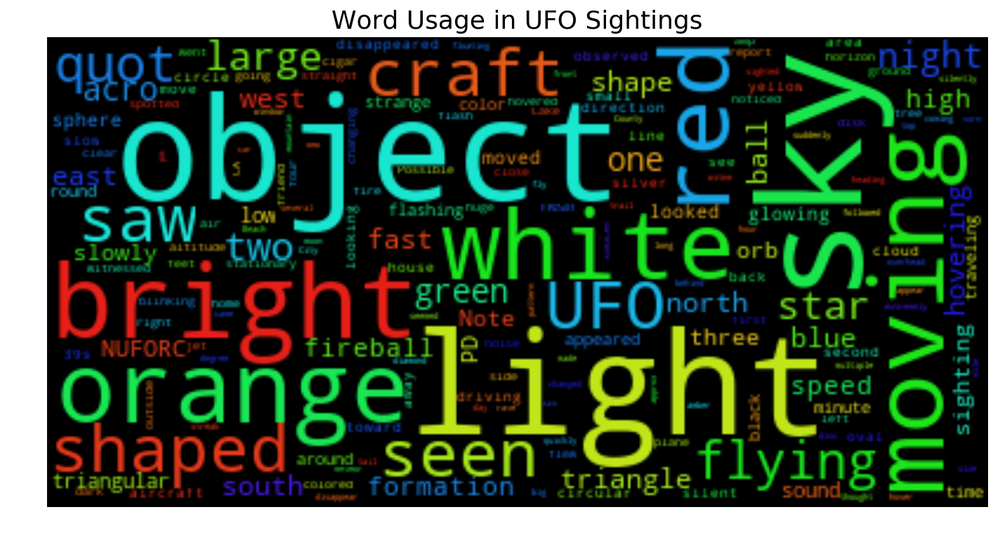

In [87]:
# generate a word cloud 
words = ' '.join(wc_subset.comments)

# generate the word cloud image
wordcloud = WordCloud(max_font_size = 60,
                      stopwords = STOPWORDS,
                      background_color='black').generate(words) #change background color here

# display the generated image
plt.figure(figsize=(12,8))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Usage in UFO Sightings', fontsize=18)
plt.axis("off");

In [96]:
from bs4 import BeautifulSoup
# Clean comments to remove any residual html that will impact Word Count
wc_subset.comments = [BeautifulSoup(x, 'lxml').get_text() for x in wc_subset.comments ]

/Users/ashley/anaconda3/lib/python3.6/site-packages/bs4/__init__.py:282: UserWarning:

"http://youtube.com/watch?v=vHE2_svuSjY" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.

/Users/ashley/anaconda3/lib/python3.6/site-packages/bs4/__init__.py:282: UserWarning:

"http://www.youtube.com/watch?v=ZSxiUVJ0u8g&amp;feature=channel" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.

/Users/ashley/anaconda3/lib/python3.6/site-packages/bs4/__init__.py:282: UserWarning:

"http://www.google.com/imgres?imgurl=http://4.bp.blogspot.com/_8RLOdlrA7l4/S0uGORphrhI/AAAAAAAAAUY/DJvZ0uoFg6E/s320/Bright-cigar-shaped-" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the

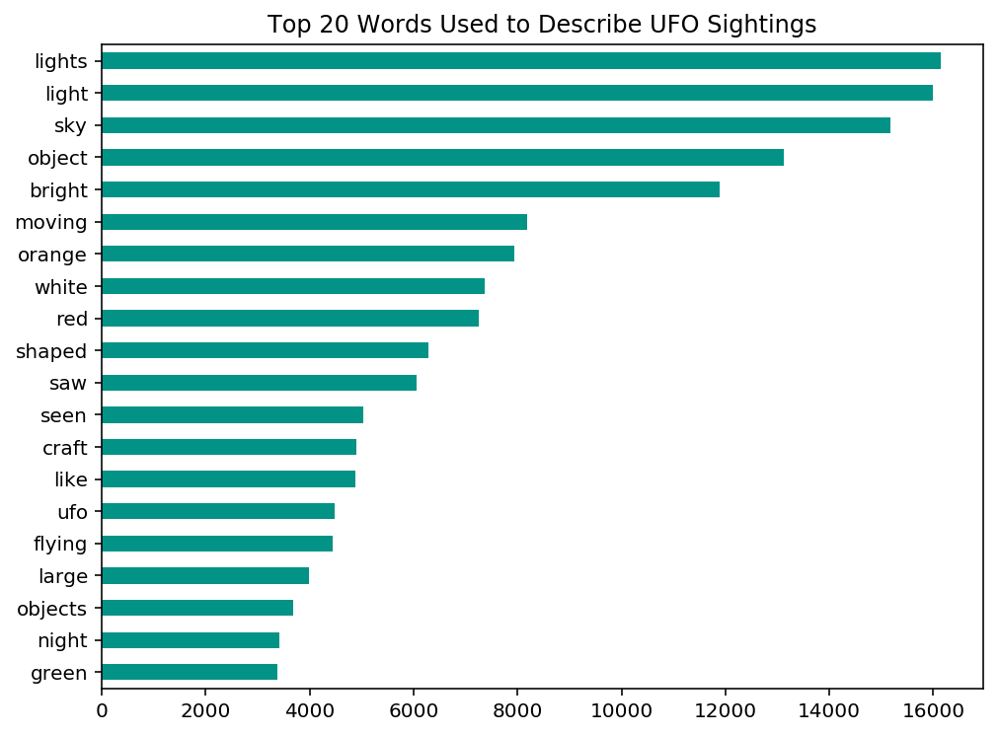

In [98]:
from sklearn.feature_extraction.text import CountVectorizer
cv = CountVectorizer(stop_words='english')

X = wc_subset.comments
plt.figure(figsize=(8,6))
count = pd.DataFrame(cv.fit_transform(X).todense(),columns=cv.get_feature_names())
count.sum().sort_values(ascending=True)[-20:].plot(kind='barh', color='XKCD:teal')
plt.title('Top 20 Words Used to Describe UFO Sightings');